In [1]:
import pandas as pd
import numpy as np
import matplotlib as plt
from matplotlib import pyplot as plt
import folium
from folium import plugins
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap

import seaborn as sns
sns.set_style("darkgrid")

%matplotlib inline

In [2]:
df=pd.read_excel("../Project Ontario Schools.xlsx")

In [3]:
df.head()

,Board Number,Board Name,Board Type,School Number,School Name,School Type,School Special Condition Code,School Level,School Language,Grade Range,...,Change in Grade 9 Academic Mathematics Acheivement Over Three Years,Percentage of Grade 9 Students Achieving the Provincial Standard in Applied Mathematics,Change in Grade 9 Applied Mathematics Achievement Over Three Years,Percentage of Students That Passed the Grade 10 OSSLT on Their First Attempt,Change in Grade 10 OSSLT Literacy Achievement Over Three Years,Percentage of Children Who Live in Low-Income Households,Percentage of Students Whose Parents Have Some Unviersity Education,Percentage of JK-Grade 3 Classes With 20 Students or Fewer,Percentage of JK-Grade 3 Classes With 23 Students or Fewer,Extract Date
0,B28010,Algoma DSB,Pub Dist Sch Brd (E/F),902344,Algoma Education Connection Secondary School,Public,Alternative,Secondary,English,9-12,...,NaN,N/R,NaN,N/R,NaN,33.88,SP,NaN,NaN,Dec-04-17
1,B28010,Algoma DSB,Pub Dist Sch Brd (E/F),19186,Anna McCrea Public School,Public,Not applicable,Elementary,English,JK-8,...,NaN,NaN,NaN,NaN,NaN,8.1,20.97,1.0,1.0,Dec-04-17
2,B28010,Algoma DSB,Pub Dist Sch Brd (E/F),67679,Arthur Henderson Public School,Public,Not applicable,Elementary,English,JK-8,...,NaN,NaN,NaN,NaN,NaN,13.42,SP,0.0,1.0,Dec-04-17
3,B28010,Algoma DSB,Pub Dist Sch Brd (E/F),43362,Ben R McMullin Public School,Public,Not applicable,Elementary,English,JK-8,...,NaN,NaN,NaN,NaN,NaN,27.9,14.95,1.0,1.0,Dec-04-17
4,B28010,Algoma DSB,Pub Dist Sch Brd (E/F),54542,Blind River Public School,Public,Not applicable,Elementary,English,JK-8,...,NaN,NaN,NaN,NaN,NaN,22.36,10.7,1.0,1.0,Dec-04-17


In [4]:
df.tail()

,Board Number,Board Name,Board Type,School Number,School Name,School Type,School Special Condition Code,School Level,School Language,Grade Range,...,Change in Grade 9 Academic Mathematics Acheivement Over Three Years,Percentage of Grade 9 Students Achieving the Provincial Standard in Applied Mathematics,Change in Grade 9 Applied Mathematics Achievement Over Three Years,Percentage of Students That Passed the Grade 10 OSSLT on Their First Attempt,Change in Grade 10 OSSLT Literacy Achievement Over Three Years,Percentage of Children Who Live in Low-Income Households,Percentage of Students Whose Parents Have Some Unviersity Education,Percentage of JK-Grade 3 Classes With 20 Students or Fewer,Percentage of JK-Grade 3 Classes With 23 Students or Fewer,Extract Date
4929,B66095,York Region DSB,Pub Dist Sch Brd (E/F),549380,Wismer Public School,Public,Not applicable,Elementary,English,JK-8,...,NaN,NaN,NaN,NaN,NaN,12.99,56.34,0.875,1.0,Dec-04-17
4930,B66095,York Region DSB,Pub Dist Sch Brd (E/F),954292,Woodbridge College,Public,Not applicable,Secondary,English,9-12,...,0.0,0.14,-15.0,0.82,-8.0,16.12,11.18,NaN,NaN,Dec-04-17
4931,B66095,York Region DSB,Pub Dist Sch Brd (E/F),617318,Woodbridge Public School,Public,Not applicable,Elementary,English,JK-8,...,NaN,NaN,NaN,NaN,NaN,14.41,21.72,1.000,1.0,Dec-04-17
4932,B66095,York Region DSB,Pub Dist Sch Brd (E/F),618896,Woodland Public School,Public,Not applicable,Elementary,English,1-8,...,NaN,NaN,NaN,NaN,NaN,15.35,40.56,NaN,NaN,Dec-04-17
4933,B66095,York Region DSB,Pub Dist Sch Brd (E/F),624101,Yorkhill Elementary School,Public,Not applicable,Elementary,English,JK-8,...,NaN,NaN,NaN,NaN,NaN,14.57,51.75,0.933,1.0,Dec-04-17


In [5]:
df.groupby(['Board Name'])['Board Name'].agg(
    {"count": len}).sort_values(
    "count", ascending=False).head(5).reset_index()

/Applications/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version
  


,Board Name,count
0,Toronto DSB,589
1,Peel DSB,261
2,Toronto CDSB,213
3,York Region DSB,212
4,Thames Valley DSB,161


In [6]:
df.describe()

,School Number,Enrolment,Latitude,Longitude,Change in Grade 3 Reading Achievement Over Three Years,Change in Grade 3 Writing Acheivement Over Three Years,Change in Grade 3 Mathematics Achievement Over Three Years,Change in Grade 6 Reading Achievement Over Three Years,Change in Grade 6 Writing Acheivement Over Three Years,Change in Grade 6 Mathematics Achievement Over Three Years,Change in Grade 9 Academic Mathematics Acheivement Over Three Years,Change in Grade 9 Applied Mathematics Achievement Over Three Years,Change in Grade 10 OSSLT Literacy Achievement Over Three Years,Percentage of JK-Grade 3 Classes With 20 Students or Fewer,Percentage of JK-Grade 3 Classes With 23 Students or Fewer
count,4934.000000,4809.000000,4934.000000,4934.000000,1233.000000,1235.000000,1241.000000,1213.000000,1212.000000,1212.000000,645.000000,606.000000,747.000000,3515.000000,3515.000000
mean,545630.117146,411.307756,44.240924,-79.717050,3.987835,-0.469636,-2.219178,1.549052,0.215347,-4.888614,0.086822,-3.315182,-1.306560,0.895240,0.999692
std,291844.462579,303.103336,1.451152,2.603641,15.081242,15.018077,16.021316,11.556731,13.040963,17.032343,11.001210,17.316156,8.070799,0.190253,0.010972
min,78.000000,10.000000,41.806950,-94.563700,-61.000000,-65.000000,-63.000000,-48.000000,-51.000000,-59.000000,-64.000000,-62.000000,-52.000000,0.000000,0.500000
25%,282184.250000,207.000000,43.477645,-80.312427,-5.000000,-9.000000,-12.000000,-5.000000,-7.000000,-16.000000,-5.000000,-14.000000,-5.000000,0.833000,1.000000
50%,595927.000000,334.000000,43.774220,-79.564585,4.000000,0.000000,-2.000000,1.000000,0.000000,-5.000000,0.000000,-3.000000,-1.000000,1.000000,1.000000
75%,798174.250000,529.000000,44.552090,-79.212620,13.000000,7.000000,8.000000,8.000000,8.000000,5.000000,5.000000,7.000000,3.000000,1.000000,1.000000
max,968729.000000,2042.000000,51.466270,-74.471020,83.000000,82.000000,64.000000,55.000000,50.000000,70.000000,49.000000,58.000000,37.000000,1.000000,1.000000


In [7]:
df.columns

Index(['Board Number', 'Board Name', 'Board Type', 'School Number',
       'School Name', 'School Type', 'School Special Condition Code',
       'School Level', 'School Language', 'Grade Range', 'Building Suite',
       'P.O. Box', 'Street', 'Municipality', 'City', 'Province', 'Postal Code',
       'Phone Number', 'Fax Number', 'School Website', 'Board Website',
       'Enrolment', 'Latitude', 'Longitude',
       'Percentage of Students Whose First Language Is Not English',
       'Percentage of Students Whose First Language Is Not French',
       'Percentage of Students Who Are New to Canada from a Non-English Speaking Country',
       'Percentage of Students Who Are New to Canada from a Non-French Speaking Country',
       'Percentage of Students Receiving Special Education Services',
       'Percentage of Students Identified as Gifted',
       'Percentage of Grade 3 Students Achieving the Provincial Standard in Reading',
       'Change in Grade 3 Reading Achievement Over Three Years

In [8]:
# Certain columns has zeros or various characters (N/R, NA, etc ...) as data, this is invalid or incomplete data
# we wil replace these with Nan or it will affect the outcome.
# We can later delete rows that tat have Nan, as there are no replacement values 

zero_not_accepted = [
    'Percentage of Students Whose First Language Is Not English',
    'Percentage of Students Whose First Language Is Not French',
    'Percentage of Students Who Are New to Canada from a Non-English Speaking Country',
    'Percentage of Students Who Are New to Canada from a Non-French Speaking Country',
    'Percentage of Students Receiving Special Education Services',
    'Percentage of Students Identified as Gifted',
    'Percentage of Grade 3 Students Achieving the Provincial Standard in Reading',
    'Change in Grade 3 Reading Achievement Over Three Years',
    'Percentage of Grade 3 Students Achieving the Provincial Standard in Writing',
    'Change in Grade 3 Writing Acheivement Over Three Years',
    'Percentage of Grade 3 Students Achieving the Provincial Standard in Mathematics',
    'Change in Grade 3 Mathematics Achievement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Reading',
    'Change in Grade 6 Reading Achievement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Writing',
    'Change in Grade 6 Writing Acheivement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Mathematics',
    'Change in Grade 6 Mathematics Achievement Over Three Years',
    'Percentage of Grade 9 Students Achieving the Provincial Standard in Academic Mathematics',
    'Change in Grade 9 Academic Mathematics Acheivement Over Three Years',
    'Percentage of Grade 9 Students Achieving the Provincial Standard in Applied Mathematics',
    'Change in Grade 9 Applied Mathematics Achievement Over Three Years',
    'Percentage of Students That Passed the Grade 10 OSSLT on Their First Attempt',
    'Change in Grade 10 OSSLT Literacy Achievement Over Three Years',
    'Percentage of Children Who Live in Low-Income Households',
    'Percentage of Students Whose Parents Have Some Unviersity Education',
    'Percentage of JK-Grade 3 Classes With 20 Students or Fewer',
    'Percentage of JK-Grade 3 Classes With 23 Students or Fewer']
    

for column in zero_not_accepted:
    df[column] = df[column].replace(0.00, np.NaN)
    df[column] = df[column].replace(0.0, np.NaN)
    df[column] = df[column].replace('N/R', np.NaN)
    df[column] = df[column].replace('SP', np.NaN)
    df[column] = df[column].replace('ND', np.NaN)
    df[column] = df[column].replace('NA', np.NaN)
    df[column] = df[column].replace('N/D', np.NaN)
    df[column] = df[column].replace('S. R.', np.NaN)    
    df[column] = df[column].replace('A/D', np.NaN)
    

In [9]:
# we don't need all those columns - only keep useful ones
cols = [
       'Board Number', 'Board Name', 'Latitude', 'Longitude', 'Board Type', 'School Number',
       'School Name', 'School Type', 'Grade Range', 'Enrolment',
       'Percentage of Students Whose First Language Is Not English',
       'Percentage of Students Whose First Language Is Not French',
       'Percentage of Students Who Are New to Canada from a Non-English Speaking Country',
       'Percentage of Students Who Are New to Canada from a Non-French Speaking Country',
       'Percentage of Students Receiving Special Education Services',
       'Percentage of Students Identified as Gifted',
       'Percentage of Grade 3 Students Achieving the Provincial Standard in Reading',
       'Change in Grade 3 Reading Achievement Over Three Years',
       'Percentage of Grade 3 Students Achieving the Provincial Standard in Writing',
       'Change in Grade 3 Writing Acheivement Over Three Years',
       'Percentage of Grade 3 Students Achieving the Provincial Standard in Mathematics',
       'Change in Grade 3 Mathematics Achievement Over Three Years',
       'Percentage of Grade 6 Students Achieving the Provincial Standard in Reading',
       'Change in Grade 6 Reading Achievement Over Three Years',
       'Percentage of Grade 6 Students Achieving the Provincial Standard in Writing',
       'Change in Grade 6 Writing Acheivement Over Three Years',
       'Percentage of Grade 6 Students Achieving the Provincial Standard in Mathematics',
       'Change in Grade 6 Mathematics Achievement Over Three Years',
       'Percentage of Grade 9 Students Achieving the Provincial Standard in Academic Mathematics',
       'Change in Grade 9 Academic Mathematics Acheivement Over Three Years',
       'Percentage of Grade 9 Students Achieving the Provincial Standard in Applied Mathematics',
       'Change in Grade 9 Applied Mathematics Achievement Over Three Years',
       'Percentage of Students That Passed the Grade 10 OSSLT on Their First Attempt',
       'Change in Grade 10 OSSLT Literacy Achievement Over Three Years',
       'Percentage of Children Who Live in Low-Income Households',
       'Percentage of Students Whose Parents Have Some Unviersity Education',
       'Percentage of JK-Grade 3 Classes With 20 Students or Fewer',
       'Percentage of JK-Grade 3 Classes With 23 Students or Fewer']


df= df[cols]

In [10]:
df.dtypes

Board Number                                                                                 object
Board Name                                                                                   object
Latitude                                                                                    float64
Longitude                                                                                   float64
Board Type                                                                                   object
School Number                                                                                 int64
School Name                                                                                  object
School Type                                                                                  object
Grade Range                                                                                  object
Enrolment                                                                                   float64


In [11]:
df["Grade Range"].value_counts()

JK-8                    2553
JK-6                     857
9-12                     817
7-8                      225
JK-5                     158
Pre-Grade 9-12           101
6-8                       88
1-8                       31
4-8                       28
JK-3                      24
5-8                       16
K-8                       15
JK-4                      12
9                          3
No Grades Applicable       2
K-6                        1
1-5                        1
9-10                       1
11-12                      1
Name: Grade Range, dtype: int64

In [12]:
# breakdown of grades ranges into grades
grade3 = ['JK-8', 'JK-6', 'JK-5', '1-8', 'JK-3', 'K-8', 'JK-4', '1-5', 'K-6']
grade6 = ['JK-8', 'JK-6', '6-8', '1-8', '4-8', '5-8', 'K-8', 'K-6']
grade9 = ['9-12', 'Pre-Grde 9-12', '9', '9-10']
grade10 = ['9-12', 'Pre-grade 9-12', '9-10']

In [13]:
# Sort by grade, and don't need all the columns - only keep useful ones
df_grade3 = df.loc[df['Grade Range'].isin(grade3)].copy()
# Removing column
list_drop3 = ['Change in Grade 6 Reading Achievement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Writing',
    'Change in Grade 6 Writing Acheivement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Mathematics',
    'Change in Grade 6 Mathematics Achievement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Reading',
    'Percentage of Grade 9 Students Achieving the Provincial Standard in Academic Mathematics',
    'Change in Grade 9 Academic Mathematics Acheivement Over Three Years',
    'Percentage of Grade 9 Students Achieving the Provincial Standard in Applied Mathematics',
    'Change in Grade 9 Applied Mathematics Achievement Over Three Years',
    'Percentage of Students That Passed the Grade 10 OSSLT on Their First Attempt',
    'Change in Grade 10 OSSLT Literacy Achievement Over Three Years']
df_grade3.drop(list_drop3, axis=1, inplace=True)
df_grade3.reset_index(drop=True, inplace=True)

In [14]:
# Sort by grade, and don't need all the columns - only keep useful ones
df_grade6 = df.loc[df['Grade Range'].isin(grade6)].copy()
list_drop6 = ['Percentage of Grade 3 Students Achieving the Provincial Standard in Reading',
    'Change in Grade 3 Reading Achievement Over Three Years',
    'Percentage of Grade 3 Students Achieving the Provincial Standard in Writing',
    'Change in Grade 3 Writing Acheivement Over Three Years',
    'Percentage of Grade 3 Students Achieving the Provincial Standard in Mathematics',
    'Change in Grade 3 Mathematics Achievement Over Three Years','Change in Grade 9 Academic Mathematics Acheivement Over Three Years',
    'Percentage of Grade 9 Students Achieving the Provincial Standard in Applied Mathematics',
    'Change in Grade 9 Applied Mathematics Achievement Over Three Years',
    'Percentage of Grade 9 Students Achieving the Provincial Standard in Academic Mathematics',
    'Percentage of Students That Passed the Grade 10 OSSLT on Their First Attempt',
    'Change in Grade 10 OSSLT Literacy Achievement Over Three Years',
    'Percentage of JK-Grade 3 Classes With 20 Students or Fewer',
    'Percentage of JK-Grade 3 Classes With 23 Students or Fewer']
df_grade6.drop(list_drop6, axis=1, inplace=True)
df_grade6.reset_index(drop=True, inplace=True)

In [15]:
# Sort by grade, and don't need all the columns - only keep useful ones
df_grade9 = df.loc[df['Grade Range'].isin(grade9)].copy()
list_drop9 = ['Percentage of Grade 3 Students Achieving the Provincial Standard in Reading',
    'Change in Grade 3 Reading Achievement Over Three Years',
    'Percentage of Grade 3 Students Achieving the Provincial Standard in Writing',
    'Change in Grade 3 Writing Acheivement Over Three Years',
    'Percentage of Grade 3 Students Achieving the Provincial Standard in Mathematics',
    'Change in Grade 3 Mathematics Achievement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Reading',
    'Change in Grade 6 Reading Achievement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Writing',
    'Change in Grade 6 Writing Acheivement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Mathematics',
    'Change in Grade 6 Mathematics Achievement Over Three Years',
    'Percentage of Students That Passed the Grade 10 OSSLT on Their First Attempt',
    'Change in Grade 10 OSSLT Literacy Achievement Over Three Years',
    'Percentage of JK-Grade 3 Classes With 20 Students or Fewer',
    'Percentage of JK-Grade 3 Classes With 23 Students or Fewer']
df_grade9.drop(list_drop9, axis=1, inplace=True)
df_grade9.reset_index(drop=True, inplace=True)

In [16]:
# Sort by grade, and don't need all the columns - only keep useful ones
df_grade10 = df.loc[df['Grade Range'].isin(grade10)].copy()
list_drop10 = ['Percentage of Grade 3 Students Achieving the Provincial Standard in Reading',
    'Change in Grade 3 Reading Achievement Over Three Years',
    'Percentage of Grade 3 Students Achieving the Provincial Standard in Writing',
    'Change in Grade 3 Writing Acheivement Over Three Years',
    'Percentage of Grade 3 Students Achieving the Provincial Standard in Mathematics',
    'Change in Grade 3 Mathematics Achievement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Reading',
    'Change in Grade 6 Reading Achievement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Writing',
    'Change in Grade 6 Writing Acheivement Over Three Years',
    'Percentage of Grade 6 Students Achieving the Provincial Standard in Mathematics',
    'Change in Grade 6 Mathematics Achievement Over Three Years',
    'Percentage of Grade 9 Students Achieving the Provincial Standard in Academic Mathematics',
    'Change in Grade 9 Academic Mathematics Acheivement Over Three Years',
    'Percentage of Grade 9 Students Achieving the Provincial Standard in Applied Mathematics',
    'Change in Grade 9 Applied Mathematics Achievement Over Three Years',
    'Percentage of JK-Grade 3 Classes With 20 Students or Fewer',
    'Percentage of JK-Grade 3 Classes With 23 Students or Fewer']
df_grade10.drop(list_drop10, axis=1, inplace=True)
df_grade10.reset_index(drop=True, inplace=True)

In [17]:
# place location as map of ontario
location = df['Latitude'].mean(), df['Longitude'].mean()

In [18]:
df_gr3_tdsb = df_grade3.loc[df_grade3['Board Name']== 'Toronto DSB']
df_gr6_tdsb = df_grade6.loc[df_grade6['Board Name']== 'Toronto DSB']
df_gr9_tdsb = df_grade9.loc[df_grade9['Board Name']== 'Toronto DSB']
df_gr10_tdsb = df_grade10.loc[df_grade10['Board Name']== 'Toronto DSB']

In [19]:
locationlist = df_grade3[["Latitude","Longitude"]].values.tolist()
labels = df_grade3["School Name"].values.tolist()

m = folium.Map(location=location, zoom_start=5)
marker_cluster = folium.plugins.MarkerCluster().add_to(m)
for point in range(len(locationlist)):
    popup = folium.Popup(labels[point], parse_html=True)
    folium.Marker(locationlist[point], popup=popup).add_to(marker_cluster)
m

In [20]:
locationlist = df_grade6[["Latitude","Longitude"]].values.tolist()
labels = df_grade6["School Name"].values.tolist()
m = folium.Map(location=location, zoom_start=5)
marker_cluster = folium.plugins.MarkerCluster().add_to(m)
for point in range(len(locationlist)):
    popup = folium.Popup(labels[point], parse_html=True)
    folium.Marker(locationlist[point], popup=popup).add_to(marker_cluster)
m

In [21]:
locationlist = df_grade9[["Latitude","Longitude"]].values.tolist()
labels = df_grade9["School Name"].values.tolist()
m = folium.Map(location=location, zoom_start=5)
marker_cluster = folium.plugins.MarkerCluster().add_to(m)
for point in range(len(locationlist)):
    popup = folium.Popup(labels[point], parse_html=True)
    folium.Marker(locationlist[point], popup=popup).add_to(marker_cluster)
m

In [22]:
locationlist = df_grade10[["Latitude","Longitude"]].values.tolist()
labels = df_grade10["School Name"].values.tolist()
m = folium.Map(location=location, zoom_start=5)
marker_cluster = folium.plugins.MarkerCluster().add_to(m)
for point in range(len(locationlist)):
    popup = folium.Popup(labels[point], parse_html=True)
    folium.Marker(locationlist[point], popup=popup).add_to(marker_cluster)
m

In [23]:
# Heat map of Grade 3 schools

schools_map = folium.Map(location=location, zoom_start = 5) 
heat_data = [[row['Latitude'],row['Longitude']] for index, row in df_grade3.iterrows()]
HeatMap(heat_data).add_to(schools_map)
schools_map

In [24]:
# Heat map of Grade 3 schools for TDSB

schools_map = folium.Map(location=location, zoom_start = 9) 
heat_data = [[row['Latitude'],row['Longitude']] for index, row in df_gr3_tdsb.iterrows()]
HeatMap(heat_data).add_to(schools_map)
schools_map

In [25]:
# Heat map of Grade 6 schools

schools_map = folium.Map(location=location, zoom_start = 5) 
heat_data = [[row['Latitude'],row['Longitude']] for index, row in df_grade6.iterrows()]
HeatMap(heat_data).add_to(schools_map)
schools_map

In [26]:
# Heat map of Grade 6 TDSB schools

schools_map = folium.Map(location=location, zoom_start = 10) 
heat_data = [[row['Latitude'],row['Longitude']] for index, row in df_gr6_tdsb.iterrows()]
HeatMap(heat_data).add_to(schools_map)
schools_map

In [27]:
# Heat map of Grade 9 schools

schools_map = folium.Map(location=location, zoom_start = 5) 
heat_data = [[row['Latitude'],row['Longitude']] for index, row in df_grade9.iterrows()]
HeatMap(heat_data).add_to(schools_map)
schools_map

In [28]:
# Heat map of Grade 9 TDSB schools

schools_map = folium.Map(location=location, zoom_start = 5) 
heat_data = [[row['Latitude'],row['Longitude']] for index, row in df_gr9_tdsb.iterrows()]
HeatMap(heat_data).add_to(schools_map)
schools_map

In [29]:
# Heat map of Grade 10 schools

schools_map = folium.Map(location=location, zoom_start = 5) 
heat_data = [[row['Latitude'],row['Longitude']] for index, row in df_grade10.iterrows()]
HeatMap(heat_data).add_to(schools_map)
schools_map

In [30]:
# Heat map of Grade 10 TDSB schools

schools_map = folium.Map(location=location, zoom_start = 5) 
heat_data = [[row['Latitude'],row['Longitude']] for index, row in df_gr10_tdsb.iterrows()]
HeatMap(heat_data).add_to(schools_map)
schools_map

In [31]:
# Cluster map of Grade 3 TDSB schools

schools_map = folium.Map(location=location, zoom_start=5)
marker_cluster = folium.plugins.MarkerCluster().add_to(schools_map)
for index, row in df_gr3_tdsb.iterrows():
    popup = folium.Popup("{0}: {1}".format(row["School Number"], row["School Name"]), parse_html=True)
    folium.Marker([row["Latitude"], row["Longitude"]], popup=popup).add_to(marker_cluster)
schools_map


In [32]:
#Cluster map of Grade 6 TDSB schools

schools_map = folium.Map(location=location, zoom_start=5)
marker_cluster = folium.plugins.MarkerCluster().add_to(schools_map)
for index, row in df_gr6_tdsb.iterrows():
    popup = folium.Popup("{0}: {1}".format(row["School Number"], row["School Name"]), parse_html=True)
    folium.Marker([row["Latitude"], row["Longitude"]], popup=popup).add_to(marker_cluster)
schools_map



In [33]:
#Cluster map of Grade 9 TDSB schools

schools_map = folium.Map(location=location, zoom_start=5)
marker_cluster = folium.plugins.MarkerCluster().add_to(schools_map)
for index, row in df_gr9_tdsb.iterrows():
    popup = folium.Popup("{0}: {1}".format(row["School Number"], row["School Name"]), parse_html=True)
    folium.Marker([row["Latitude"], row["Longitude"]], popup=popup).add_to(marker_cluster)
schools_map



In [34]:
#Cluster map of Grade 10 TDSB schools

schools_map = folium.Map(location=location, zoom_start=5)
marker_cluster = folium.plugins.MarkerCluster().add_to(schools_map)
for index, row in df_gr10_tdsb.iterrows():
    popup = folium.Popup("{0}: {1}".format(row["School Number"], row["School Name"]), parse_html=True)
    folium.Marker([row["Latitude"], row["Longitude"]], popup=popup).add_to(marker_cluster)
schools_map



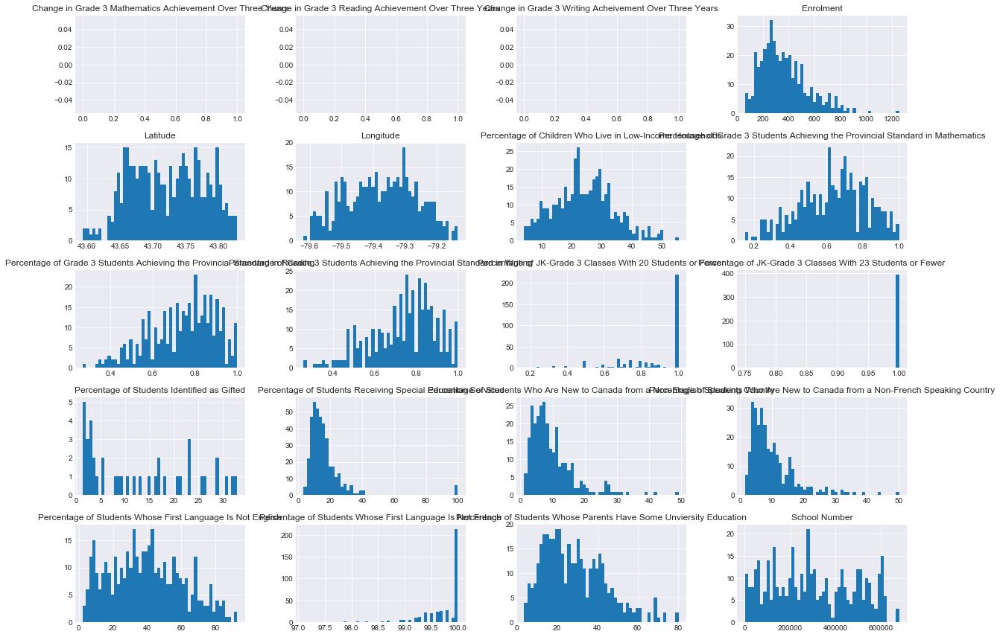

In [35]:
#To get a feel for the type of data we are dealing with, we plot a histogram for each 
# numeric variable.
df_gr3_tdsb.hist(bins=50, figsize=(20,15))
plt.savefig("attribute_histogram_plots")
plt.show()

